## Embedding and  Deep Learning



In [1]:
## for data
import json
import pandas as pd
import numpy as np
## for plotting
import matplotlib.pyplot as plt
import seaborn as sns
## for processing
import re
import nltk
## for bag-of-words
from sklearn import feature_extraction, model_selection, naive_bayes, pipeline, manifold, preprocessing
from nlp_fn import *
import gensim
import gensim.downloader as gensim_api

## for deep learning
from tensorflow.keras import layers, preprocessing as kprocessing
from tensorflow.keras import backend as K
## for bert language model
import transformers
import warnings
warnings.filterwarnings("ignore")



I0203 14:36:01.254357 4592039360 file_utils.py:32] TensorFlow version 2.1.0 available.
I0203 14:36:01.730266 4592039360 file_utils.py:39] PyTorch version 1.0.0 available.
I0203 14:36:01.858940 4592039360 modeling_xlnet.py:194] Better speed can be achieved with apex installed from https://www.github.com/nvidia/apex .


In [18]:
dtf=pd.read_csv("topic-modeled-abstracts-1.csv", index_col=0)
dtf.head()

,Unnamed: 0.1,pubmed_id,mesh_term,abstract,bow_length,dominant_topic,topic_probability,mesh_term_index,clean_text
0,0,33107461,Physical Phenomena,To evaluate and compare the effect of contamin...,59.0,14.0,0.543822,0,evaluate compare effect contamination haemosta...
1,1,33107259,Physical Phenomena,To establish a new mechanical model of distal ...,92.0,5.0,0.399744,0,establish new mechanical model distal humerus ...
2,2,33097152,Physical Phenomena,Various manganese oxides (MnOx) prepared via c...,84.0,16.0,0.421532,0,various manganese oxide mnox prepare via citri...
3,3,33095536,Physical Phenomena,We report a patient with recurrent glioblastom...,24.0,13.0,0.362181,0,report patient recurrent glioblastoma eloquent...
4,4,33089281,Physical Phenomena,To compare the stress distribution of dental i...,75.0,14.0,0.373831,0,compare stress distribution dental implant dif...


In [48]:
dtf.columns


Index(['Unnamed: 0.1', 'pubmed_id', 'mesh_term', 'abstract', 'bow_length',
       'dominant_topic', 'topic_probability', 'mesh_term_index', 'clean_text'],
      dtype='object')

In [19]:
del dtf['Unnamed: 0.1']

In [20]:
dtf.head()

,pubmed_id,mesh_term,abstract,bow_length,dominant_topic,topic_probability,mesh_term_index,clean_text
0,33107461,Physical Phenomena,To evaluate and compare the effect of contamin...,59.0,14.0,0.543822,0,evaluate compare effect contamination haemosta...
1,33107259,Physical Phenomena,To establish a new mechanical model of distal ...,92.0,5.0,0.399744,0,establish new mechanical model distal humerus ...
2,33097152,Physical Phenomena,Various manganese oxides (MnOx) prepared via c...,84.0,16.0,0.421532,0,various manganese oxide mnox prepare via citri...
3,33095536,Physical Phenomena,We report a patient with recurrent glioblastom...,24.0,13.0,0.362181,0,report patient recurrent glioblastoma eloquent...
4,33089281,Physical Phenomena,To compare the stress distribution of dental i...,75.0,14.0,0.373831,0,compare stress distribution dental implant dif...


In [9]:
dtf.abstract[39]

'IFN-stimulated gene (ISG) 15 is a type 1 IFN-induced protein and known to modify target proteins in a manner similar to ubiquitylation (protein conjugation by ISG15 is termed ISGylation). We sought to determine the role of ISG15 and its underlying mechanisms in corneal innate immune defense against Pseudomonas aeruginosa keratitis.\nISG15 expression in cultured human corneal epithelial cells (HCECs) and mouse corneas was determined by PCR and Western blot analysis. Gene knockout mice were used to define the role of ISG15 signaling in controlling the severity of P. aeruginosa keratitis, which was assessed with photographing, clinical scoring, bacterial counting, myeloperoxidase assay, and quantitative PCR determination of cytokine expression. Integrin LFA-1 inhibitor was used to assess its involvement of ISG15 signaling in P. aeruginosa-infected corneas.\nHeat-killed P. aeruginosa induced ISG15 expression in cultured HCECs and accumulation in the conditioned media. Isg15 deficiency acc

In [21]:
dtf=dtf.loc[~dtf.abstract.isna()]
dtf.shape

(14661, 8)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
 <a list of 15 Text xticklabel objects>)

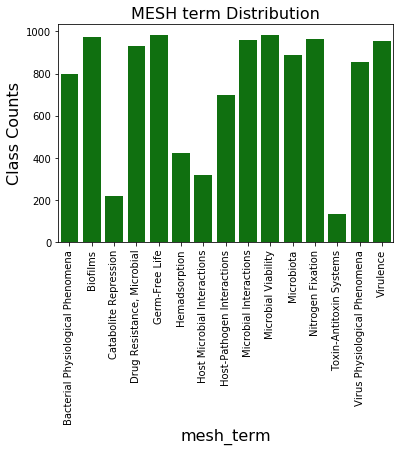

In [135]:
%matplotlib inline

#import seaborn as sns
#import matplotlib.pyplot as plt

plt.figure()
sns.countplot(x=dtf.mesh_term,color='green')
plt.title('MESH term Distribution', fontsize=16)
plt.ylabel('Class Counts', fontsize=16)
plt.xlabel('mesh_term', fontsize=16)
plt.xticks(rotation='vertical')



## Named Entity Recognition (NER) : Extracting Entities

In [8]:
#!pip install https://s3-us-west-2.amazonaws.com/ai2-s2-scispacy/releases/v0.2.5/en_core_sci_md-0.2.5.tar.gz
#!python3 -m spacy download en_core_sci_md

import spacy
ner = spacy.load('en_core_sci_lg')

In [9]:
docs = ner.pipe(dtf.abstract, disable=['tagger', 'parser'])
docs = list(docs)

In [10]:
entities = []
for d in docs:
    doc_ents = []
    for e in d.ents:
        doc_ents.append(e.text)
    entities.append(doc_ents)

In [11]:
entities

[['evaluate',
  'compare',
  'effect',
  'contamination',
  'haemostatic agents',
  'Tranexamic Acid',
  'TA',
  'Ethamsylate',
  'shear bond strength',
  'human',
  'premolars',
  'groups',
  'samples',
  'Group I',
  'Transbond',
  'Group II',
  'Transbond',
  'blood contamination',
  'groups III',
  'IV',
  'Transbond',
  'contamination',
  'Tranexamic acid',
  'shear bond strength',
  'measured',
  'data',
  'ANOVA',
  'Tukey',
  'Group I',
  'shear bond strength',
  'SBS',
  'Group II',
  'teeth',
  'contaminated',
  'blood',
  'SBS',
  'values',
  'ANOVA',
  'groups',
  'Tukey HSD',
  'contamination',
  'TA',
  'Group III',
  'statistically higher',
  'SBS',
  'contamination',
  'Ethamsylate',
  'Group IV',
  'tranexamic acid',
  'ethamsylate',
  'reduces',
  'bleeding',
  'surgery',
  'haemostatic agents',
  'bonding',
  'situations',
  'blood contamination'],
 ['mechanical model',
  'distal humerus',
  'children',
  'epiphysial cartilage',
  'stimulate',
  'supracondylar humeru

In [12]:
dtf['entities'] = entities

In [13]:
dtf['entities'] =dtf['entities'].apply(lambda x: ' '.join(x))



In [14]:
dtf.head()

,pubmed_id,mesh_term,abstract,bow_length,dominant_topic,topic_probability,mesh_term_index,clean_text,entities
0,33107461,Physical Phenomena,To evaluate and compare the effect of contamin...,59.0,14.0,0.543822,0,evaluate compare effect contamination haemosta...,evaluate compare effect contamination haemosta...
1,33107259,Physical Phenomena,To establish a new mechanical model of distal ...,92.0,5.0,0.399744,0,establish new mechanical model distal humerus ...,mechanical model distal humerus children epiph...
2,33097152,Physical Phenomena,Various manganese oxides (MnOx) prepared via c...,84.0,16.0,0.421532,0,various manganese oxide mnox prepare via citri...,manganese oxides MnOx citric acid solution com...
3,33095536,Physical Phenomena,We report a patient with recurrent glioblastom...,24.0,13.0,0.362181,0,report patient recurrent glioblastoma eloquent...,report patient recurrent glioblastoma eloquent...
4,33089281,Physical Phenomena,To compare the stress distribution of dental i...,75.0,14.0,0.373831,0,compare stress distribution dental implant dif...,compare stress distribution dental implants bo...


In [314]:
%matplotlib inline

from wordcloud import WordCloud

def plot_word_cloud(text):
    wordcloud_instance = WordCloud(width = 800, height = 800, 
                background_color ='black', 
                stopwords=None,
                min_font_size = 10).generate(text) 
             
    plt.figure(figsize = (8, 8), facecolor = None) 
    plt.imshow(wordcloud_instance) 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.show()
        
        

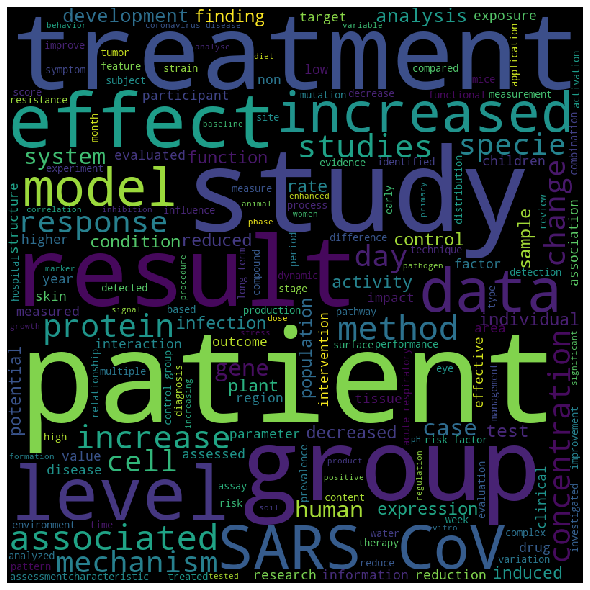

In [315]:
texts = ''
for index, item in dtf.iterrows():
    texts = texts + ' ' + item['entities']
    
plot_word_cloud(texts)

In [96]:
dtf2 = dtf.loc[dtf.topic_probability >=0.9]
# dtf.head(); dtf.shape

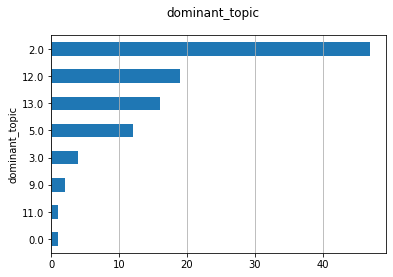

In [97]:
import matplotlib.pyplot as plt
import seaborn as sns
fig, ax = plt.subplots()
fig.suptitle("dominant_topic", fontsize=12)
dtf2["dominant_topic"].reset_index().groupby("dominant_topic").count().sort_values(by= 
       "index").plot(kind="barh", legend=False, 
        ax=ax).grid(axis='x')
plt.show()

## Split the dataframe into train / test

In [22]:
#stratify
dtf_train, dtf_test = model_selection.train_test_split(dtf, test_size=0.3, shuffle= True) 

In [23]:
print("X_train shape:", dtf_train.drop("mesh_term", axis=1).shape, "| X_test shape:", dtf_test.drop("mesh_term", axis=1).shape)
print("mesh_term:")
for i in dtf_train["mesh_term"].value_counts(normalize=True).index:
    print(" ", i, " -->  train:", round(dtf_train["mesh_term"].value_counts(normalize=False).loc[i], 2),
                          "| test:", round(dtf_test["mesh_term"].value_counts(normalize=False).loc[i], 2))
print(dtf_train.shape[1], "features:", dtf_train.drop("mesh_term", axis=1).columns.to_list())

X_train shape: (10262, 7) | X_test shape: (4399, 7)
mesh_term:
  Cell Physiological Phenomena  -->  train: 675 | test: 264
  Metabolism  -->  train: 664 | test: 296
  Plant Physiological Phenomena  -->  train: 661 | test: 299
  Mathematical Concepts  -->  train: 657 | test: 272
  Digestive System and Oral Physiological Phenomena  -->  train: 649 | test: 275
  Biological Phenomena  -->  train: 646 | test: 279
  Integumentary System Physiological Phenomena  -->  train: 645 | test: 275
  Physiological Phenomena  -->  train: 634 | test: 250
  Microbiological Phenomena  -->  train: 632 | test: 244
  Ocular Physiological Phenomena  -->  train: 632 | test: 278
  Physical Phenomena  -->  train: 619 | test: 277
  Genetic Phenomena  -->  train: 611 | test: 284
  Musculoskeletal and Neural Physiological Phenomena  -->  train: 575 | test: 281
  Circulatory and Respiratory Physiological Phenomena  -->  train: 573 | test: 252
  Reproductive and Urinary Physiological Phenomena  -->  train: 570 | test

In [24]:
# y_train = dtf_train["dominant_topic"].values
# y_test = dtf_test["dominant_topic"].values
y_train = dtf_train["mesh_term"].values
y_test = dtf_test["mesh_term"].values

## Features Engineering with sequence padding

I0203 15:03:32.133919 4592039360 phrases.py:475] collecting all words and their counts
I0203 15:03:32.148561 4592039360 phrases.py:482] PROGRESS: at sentence #0, processed 0 words and 0 word types
I0203 15:03:35.008741 4592039360 phrases.py:482] PROGRESS: at sentence #10000, processed 1408912 words and 892669 word types
I0203 15:03:35.140897 4592039360 phrases.py:505] collected 911841 word types from a corpus of 1445938 words (unigram + bigrams) and 10262 sentences
I0203 15:03:35.142715 4592039360 phrases.py:558] using 911841 counts as vocab in Phrases<0 vocab, min_count=5, threshold=10, max_vocab_size=40000000>
I0203 15:03:35.154304 4592039360 phrases.py:816] source_vocab length 911841
I0203 15:03:45.067531 4592039360 phrases.py:825] Phraser built with 10777 phrasegrams
I0203 15:03:45.090525 4592039360 phrases.py:475] collecting all words and their counts
I0203 15:03:45.092426 4592039360 phrases.py:482] PROGRESS: at sentence #0, processed 0 words and 0 word types
I0203 15:03:50.898256

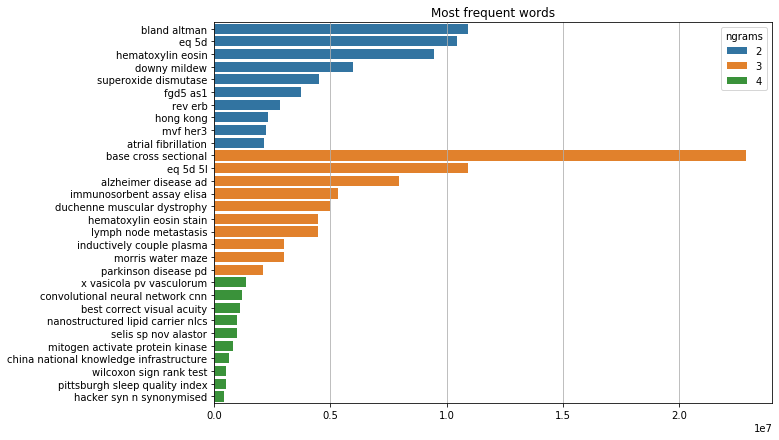

In [25]:
lst_common_terms = ["of","with","without","and","or","the","a"]

lst_ngrams_detectors, dtf_ngrams = create_ngrams_detectors(corpus=dtf_train["clean_text"], 
                                                           lst_common_terms=lst_common_terms, min_count=5, 
                                                           top=10, figsize=(10,7))




In [36]:
lst_ngrams_detectors

In [35]:
dtf_ngrams

,word,freq,ngrams
8777,bland altman,1.094019e+07,2
13135,eq 5d,1.044291e+07,2
1595,hematoxylin eosin,9.448348e+06,2
8136,downy mildew,5.967378e+06,2
1671,superoxide dismutase,4.520741e+06,2
...,...,...,...
8320,provide new insight mechanism,1.868847e+01,4
12531,cross sectional study aim,1.779501e+01,4
6321,present study aim evaluate,1.745092e+01,4
8142,disease covid cause severe,1.715651e+01,4


In [26]:
corpus=dtf_train["clean_text"]

In [38]:
lst_corpus = utils_preprocess_ngrams(corpus, ngrams=1, grams_join=" ", lst_ngrams_detectors=lst_ngrams_detectors)

In [28]:
lst_corpus

[['integrons',
  'play major role',
  'evolution',
  'spread',
  'antimicrobial resistance',
  'human pathogen',
  'include',
  'escherichia coli',
  'study',
  'describe',
  'occurrence',
  'class',
  'integrons',
  'human',
  'pathogenic',
  'e coli',
  'three',
  'isolate',
  'collection',
  'involve',
  'three',
  'period',
  'last year',
  'murray',
  'collection',
  'bacteria',
  'isolate',
  '1910s',
  '1940s',
  'ii',
  'e coli',
  'reference',
  'ecor',
  'collection',
  'isolate',
  'mainly',
  '1980s',
  'iii',
  'recently',
  'assemble',
  'collection',
  'isolate',
  'obtain',
  'high quality',
  'whole genome sequence',
  'wgss',
  'available',
  'isolate',
  'integrons',
  'detect',
  'wgss',
  'program',
  'integronfinder',
  'result',
  'compare',
  'three',
  'establish',
  'method',
  'polymerase chain reaction',
  'detection',
  'integrase',
  'gene',
  'ii',
  'blast',
  'search',
  'use',
  'draft genome',
  'iii',
  'map',
  'short',
  'read',
  'integrons',
  'f

In [54]:
## tokenize text
top=None
print("--- tokenization ---")
tokenizer = kprocessing.text.Tokenizer(num_words=top,lower=True, split=' ')
tokenizer.fit_on_texts(lst_corpus)
dic_vocabulary = tokenizer.word_index
print(len(dic_vocabulary), "words")
## create sequence
lst_text2seq= tokenizer.texts_to_sequences(lst_corpus)
## padding sequence
print("--- padding to sequence ---")
X_train = kprocessing.sequence.pad_sequences(lst_text2seq, 
                    maxlen=100, padding="post", truncating="post")
print(X_train.shape[0], "sequences of length", X_train.shape[1]) 

--- tokenization ---
78772 words
--- padding to sequence ---
10262 sequences of length 100


In [58]:
tokenizer.texts_to_sequences(lst_corpus)

[[23578,
  9541,
  785,
  791,
  3677,
  10826,
  8,
  2705,
  4,
  169,
  715,
  689,
  23578,
  57,
  1309,
  2437,
  70,
  176,
  1269,
  158,
  70,
  186,
  5157,
  27683,
  1269,
  518,
  176,
  48651,
  30430,
  767,
  2437,
  660,
  34025,
  1269,
  176,
  435,
  20449,
  968,
  596,
  3340,
  1269,
  176,
  147,
  2282,
  5451,
  39344,
  366,
  176,
  23578,
  89,
  39344,
  401,
  48652,
  9,
  13,
  70,
  268,
  24,
  7505,
  253,
  30431,
  49,
  767,
  9038,
  618,
  2,
  14707,
  968,
  490,
  856,
  1245,
  23578,
  11,
  27683,
  1269,
  176,
  21,
  23578,
  47,
  176,
  34025,
  1269,
  3340,
  20449,
  176,
  39345,
  1536,
  3677,
  1756,
  47,
  27683,
  1269,
  176,
  269,
  47,
  34025,
  1269,
  176,
  176,
  147,
  39345],
 [160,
  1639,
  86,
  6442,
  1512,
  6693,
  16,
  6,
  2808,
  601,
  1921,
  16188,
  203,
  190,
  1006,
  7829,
  20450,
  3764,
  30432,
  48,
  6442,
  13,
  1850,
  3055,
  21,
  3289,
  27684,
  118,
  552,
  261,
  10,
  34,
  2107

In [45]:
dic_vocabulary

{'NaN': 1,
 'use': 2,
 'patient': 3,
 'study': 4,
 'group': 5,
 'increase': 6,
 'treatment': 7,
 'include': 8,
 'result': 9,
 'show': 10,
 'find': 11,
 'cell': 12,
 'compare': 13,
 'base': 14,
 'also': 15,
 'effect': 16,
 'level': 17,
 'model': 18,
 'associate': 19,
 'test': 20,
 'however': 21,
 'data': 22,
 'identify': 23,
 'method': 24,
 'change': 25,
 'time': 26,
 'may': 27,
 'different': 28,
 'protein': 29,
 'control': 30,
 'two': 31,
 'disease': 32,
 'covid': 33,
 'reduce': 34,
 'respectively': 35,
 'measure': 36,
 'case': 37,
 'analysis': 38,
 'evaluate': 39,
 'response': 40,
 'one': 41,
 'report': 42,
 'follow': 43,
 'induce': 44,
 'decrease': 45,
 'high': 46,
 'present': 47,
 'higher': 48,
 'gene': 49,
 'activity': 50,
 'process': 51,
 'system': 52,
 'specie': 53,
 'day': 54,
 'well': 55,
 'total': 56,
 'human': 57,
 'among': 58,
 'perform': 59,
 'relate': 60,
 'expression': 61,
 'ass': 62,
 'potential': 63,
 'cause': 64,
 'observe': 65,
 'could': 66,
 'develop': 67,
 'provide'

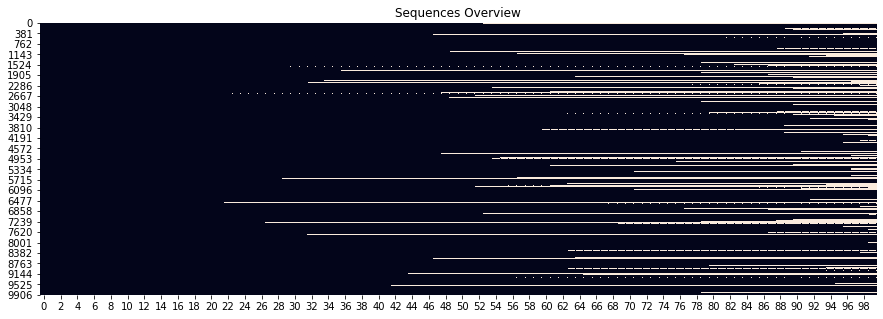

In [55]:
## plot heatmap
fig, ax = plt.subplots(figsize=(15,5))
sns.heatmap(X_train==0, vmin=0, vmax=1, cbar=False, ax=ax).set_title('Sequences Overview')
plt.show()








In [56]:
X_train

array([[23578,  9541,   785, ...,   176,   176,   147],
       [  160,  1639,    86, ...,  7829,   108,  6442],
       [  620, 27685,  7506, ...,   174,    80,   605],
       ...,
       [  682,  6492,   465, ...,  7528,  1293,  6158],
       [ 8579,   311,   294, ...,     0,     0,     0],
       [ 4522, 36187,  5316, ...,   731,    61,   405]], dtype=int32)

In [57]:
len(tokenizer.index_word)





78772

--- tokenization ---
49431 words
--- padding to sequence ---
4399 sequences of length 100


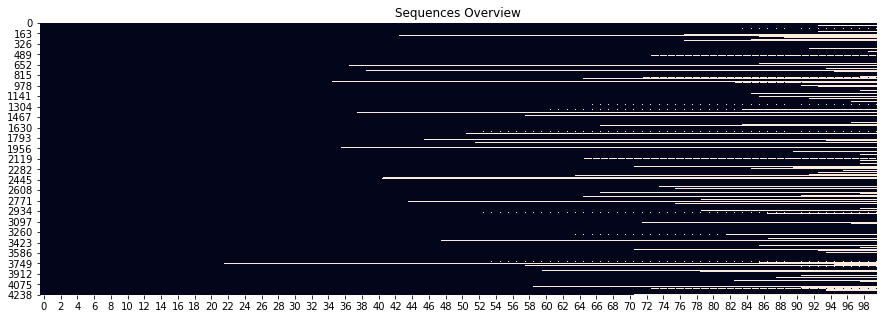

In [83]:
X_test = text2seq(corpus=dtf_test["clean_text"], lst_ngrams_detectors=lst_ngrams_detectors, maxlen=X_train.shape[1])

In [78]:
X_test.keys()

dict_keys(['X', 'tokenizer', 'dic_vocabulary'])

In [79]:
X_test=X_test['X']
X_test

array([[ 3063,  1196,   648, ...,  1196,   148,     0],
       [23142, 15828,  2061, ...,   551,   809,   325],
       [   72,  1687,  4000, ...,     0,     0,     0],
       ...,
       [ 6699, 49386,  8300, ..., 49388,   247,     0],
       [  516,  7699,   625, ...,   278,  8137,  2562],
       [ 8938,   235,   436, ...,    65,  1921,  2749]], dtype=int32)

In [31]:
dtf_train["abstract"].iloc[2]

'A polyphasic approach was used to characterize a novel nitrogen-fixing bacterial strain, designated YC6995(T), isolated from the rhizosphere soil of Iris ensata var. spontanea (Makino) Nakai inhabiting a wetland located at an altitude of 960 m on Jiri Mountain, Korea. Strain YC6995(T) cells were Gram-negative, and rod-shaped, with motility provided by a single polar flagellum. Optimal growth conditions were 30 °C and pH 7.0. The major fatty acids of strain YC6995(T) were C18:1 ω7c, C18:1 2-OH and C16:0 3-OH. The major respiratory quinone was ubiquinone-10 (Q-10). The polar lipids were phosphatidylethanolamine, phosphatidyldimethylethanolamine, phosphatidylcholine, phosphatidylglycerol and unidentified glycolipids. The genomic DNA G+C content was 64.1 mol%. Phylogenetic analysis based on 16S rRNA gene sequences showed strain YC6995(T) to form a phyletic lineage with Nitrospirillum amazonense DSM 2787(T) with a high sequence similarity (97.2 %), but it displayed low sequence similarity 

In [32]:
dtf_train["entities"].iloc[2]

'polyphasic approach nitrogen-fixing bacterial strain isolated rhizosphere soil Iris ensata var. spontanea (Makino) Nakai inhabiting wetland altitude Jiri Mountain Korea Strain YC6995(T) cells Gram-negative rod-shaped motility single polar flagellum Optimal growth conditions pH fatty acids strain C18:1 ω7c C18:1 2-OH C16:0 3-OH respiratory quinone ubiquinone-10 Q-10 polar lipids phosphatidylethanolamine phosphatidyldimethylethanolamine phosphatidylcholine phosphatidylglycerol glycolipids genomic DNA G+C content Phylogenetic analysis 16S rRNA gene sequences strain phyletic lineage Nitrospirillum amazonense DSM high sequence similarity low sequence similarity genera Azospirillum Rhodocista Skermanella family Alphaproteobacteria phenotypic chemotaxonomic phylogenetic evidences strain species genus Nitrospirillum Nitrospirillum sp. nov. type strain emended description genus Nitrospirillum'

In [84]:
# check text conversion
i = 2

## list of text: ["I like this", ...]
len_txt = len(dtf_train["clean_text"].iloc[i].split())
print("from: ", dtf_train["clean_text"].iloc[i], "| len:", len_txt)

## sequence of token ids: [[1, 2, 3], ...]
len_tokens = len(X_train[i])
print("to: ", X_train[i], "| len:", len(X_train[i]))

## vocabulary: {"I":1, "like":2, "this":3, ...}
print("check: ", dtf_train["clean_text"].iloc[i].split()[0], " -- idx in vocabulary -->", 
      dic_vocabulary[dtf_train["clean_text"].iloc[i].split()[0]])

print("vocabulary: ", dict(list(dic_vocabulary.items())[0:5]), "... (padding element, 0)")

from:  bacterial panicle blight rice seedborne disease cause bacterium burkholderia glumae disease affect rice production worldwide effect likely become devastate continuous increase global temperature especially grow season bacterium cause disease symptom different tissue different developmental stag reproductive stag bacterium interfere grain development panicle result directly affect rice yield currently method control disease chemical control effective completely resistant cultivar available thus promise approach use antagonistic microorganism work identify one strain pseudomonas protegens one strain b cepacia antimicrobial activity b glumae vitro planta characterize antimicrobial activity p protegens find activity associate bacterial secretion cell free secretion p protegens inhibit growth b glumae vitro also prevent b glumae cause disease rice although specific molecule associate activity identify find suggest secrete fraction p protegens could harness biopesticides control bacte

In [34]:
list(dic_vocabulary.items())[15826]

('reca gyrb', 15827)


## Embeddings with Pretrained Word Vectors 

In [23]:
#Diffrent sets of code if using Spacy or Gensim
import spacy
nlp = spacy.load('en_core_sci_lg')
#nlp = gensim_api.load("glove-wiki-gigaword-300")

In [158]:
#check spacy nlp model
len(nlp.vocab.get_vector('horse')) 

200

In [85]:
# check gensim nlp model
word = "cancer"
nlp[word].shape

In [24]:
len(dic_vocabulary)

84577

In [25]:
embedding_dimension = len(nlp.vocab.get_vector('horse')) 

In [26]:
#spacy
def vocabulary_embeddings(dic_vocabulary, nlp=None):
    #nlp = gensim_api.load("glove-wiki-gigaword-300") if nlp is None else nlp
    nlp = gensim_api.load('en_core_sci_lg') if nlp is None else nlp
    embeddings = np.zeros((len(dic_vocabulary)+1, embedding_dimension))
    for word,idx in dic_vocabulary.items():
        ## update the row with vector
        try:
            embeddings[idx] =  nlp.vocab.get_vector(word)
        ## if word not in model then skip and the row stays all zeros
        except:
            pass
    print("vocabulary mapped to", embeddings.shape[0], "vectors of size", embeddings.shape[1])
    return embeddings

# #gensim
# def vocabulary_embeddings(dic_vocabulary, nlp=None):
#     #nlp = gensim_api.load("glove-wiki-gigaword-300") if nlp is None else nlp
#     nlp = gensim_api.load('en_core_sci_lg') if nlp is None else nlp
#     embeddings = np.zeros((len(dic_vocabulary)+1, nlp.vector_size))
#     for word,idx in dic_vocabulary.items():
#         ## update the row with vector
#         try:
#             embeddings[idx] =  nlp[word]
#         ## if word not in model then skip and the row stays all zeros
#         except:
#             pass
#     print("vocabulary mapped to", embeddings.shape[0], "vectors of size", embeddings.shape[1])
#     return embeddings




In [27]:
embeddings = vocabulary_embeddings(dic_vocabulary, nlp)

vocabulary mapped to 84578 vectors of size 200


In [71]:
 ## encode y
dic_y_mapping = {n:label for n,label in 
                 enumerate(np.unique(y_train))}
inverse_dic = {v:k for k,v in dic_y_mapping.items()}
y_train = np.array([inverse_dic[y] for y in y_train])

In [72]:
y_train

array([ 8, 10, 14, ...,  1, 13,  0])

In [73]:
embeddings.shape[1]

300

# LSTM Model Design 
## Load and Train NLP

In [31]:
# Embedding network with Bi-LSTM 

## input
x_in = layers.Input(shape=(100,))
## embedding
x = layers.Embedding(input_dim=embeddings.shape[0],  
                     output_dim=embeddings.shape[1], 
                     weights=[embeddings],
                     input_length=200, trainable=False)(x_in)
## 2 layers of bidirectional lstm
x = layers.Bidirectional(layers.LSTM(units=100, dropout=0.2, 
                         return_sequences=True))(x)
x = layers.Bidirectional(layers.LSTM(units=100, dropout=0.2))(x)
## final dense layers
x = layers.Dense(64, activation='relu')(x)
y_out = layers.Dense(17, activation='softmax')(x)
## compile
model = models.Model(x_in, y_out)
model.compile(loss='sparse_categorical_crossentropy',
              optimizer='adam', metrics=['accuracy'])

model.summary()

## train
training = model.fit(x=X_train, y=y_train, batch_size=256, epochs=10, shuffle=True, verbose=0, validation_split=0.3)
utils_plot_keras_training(training)
## test
predicted_prob = model.predict(X_test)
predicted = [dic_y_mapping[np.argmax(pred)] for pred in predicted_prob]




Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 100)]             0         
_________________________________________________________________
embedding_1 (Embedding)      (None, 100, 200)          16915600  
_________________________________________________________________
bidirectional_2 (Bidirection (None, 100, 200)          240800    
_________________________________________________________________
bidirectional_3 (Bidirection (None, 200)               240800    
_________________________________________________________________
dense_2 (Dense)              (None, 64)                12864     
_________________________________________________________________
dense_3 (Dense)              (None, 17)                1105      
Total params: 17,411,169
Trainable params: 495,569
Non-trainable params: 16,915,600
_________________________________________

## Evaluate model performance

In [37]:

def evaluate_multi_classif(y_test, predicted, predicted_prob, figsize=(8,3)):
    classes = np.unique(y_test)
    y_test_array = pd.get_dummies(y_test, drop_first=False).values
    
    ## Accuracy, Precision, Recall
    accuracy = metrics.accuracy_score(y_test, predicted)
    auc = metrics.roc_auc_score(y_test, predicted_prob, multi_class="ovr")
    print("Accuracy:",  round(accuracy,2))
    print("Auc:", round(auc,2))
    print("Detail:")
    print(metrics.classification_report(y_test, predicted))
    
    ## Plot confusion matrix
    cm = metrics.confusion_matrix(y_test, predicted)
    fig, ax = plt.subplots()
    sns.heatmap(cm, annot=True, fmt='d', ax=ax, cmap=plt.cm.Blues, cbar=False)
    ax.set(xlabel="Pred", ylabel="True", xticklabels=classes, yticklabels=classes, title="Confusion matrix")
    plt.yticks(rotation=1)
    plt.xticks(rotation=45, ha="right")

    fig, ax = plt.subplots()

## Plot roc
    for i in range(len(classes)):
        fpr, tpr, thresholds = metrics.roc_curve(y_test_array[:,i],  
                               predicted_prob[:,i])
        ax.plot(fpr, tpr, lw=3, 
                  label='{0} (area={1:0.2f})'.format(classes[i], 
                                  metrics.auc(fpr, tpr))
                   )
    ax.plot([0,1], [0,1], color='navy', lw=3, linestyle='--')
    ax.set(xlim=[-0.05,1.0], ylim=[0.0,1.05], 
              xlabel='False Positive Rate', 
              ylabel="True Positive Rate (Recall)", 
              title="Receiver operating characteristic")
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    #ax.legend(loc="right")
    ax.grid(True)
    
    fig, ax = plt.subplots()
    ## Plot precision-recall curve
    for i in range(len(classes)):
        precision, recall, thresholds = metrics.precision_recall_curve(
                     y_test_array[:,i], predicted_prob[:,i])
        ax.plot(recall, precision, lw=3, 
                   label='{0} (area={1:0.2f})'.format(classes[i], 
                                      metrics.auc(recall, precision))
                  )
    ax.set(xlim=[0.0,1.05], ylim=[0.0,1.05], xlabel='Recall', 
              ylabel="Precision", title="Precision-Recall curve")
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    ax.grid(True)
    plt.show()





In [38]:
evaluate_multi_classif(y_test, predicted, predicted_prob, figsize=(8,3))

# CNN model Design 

In [43]:
import string
import re
from os import listdir
from numpy import array
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.utils.vis_utils import plot_model
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import Flatten
from keras.layers import Embedding
from keras.layers import Dropout
from keras.layers.convolutional import Conv1D
from keras.layers.convolutional import MaxPooling1D

Using TensorFlow backend.


In [86]:
vocab_size = len(tokenizer.word_index) + 1
print('Vocabulary size: %d' % vocab_size)

Vocabulary size: 78773


In [70]:
# only if selected top=20000
tokenizer.num_words

In [131]:
# max_length = max([len(s.split()) for s in corpus])
# print('Maximum length: %d' % max_length)

Maximum length: 692


In [197]:
# from pretrained word embeddings run much lower down and used here now

embeddings.shape[1]

300

In [74]:
def define_model(vocab_size, max_length):
    model = Sequential()
#     model.add(Embedding(vocab_size, 100, input_length=max_length))
    model.add(Embedding(
        len(tokenizer.word_index) + 1,
        embeddings.shape[1],
        weights=[embeddings],
        input_length=100,
        trainable=False
    ))
    #model.add(Conv1D(filters=64, kernel_size=3, activation='relu'))
    model.add(Conv1D(32, 8, activation='relu'))
    model.add(Conv1D(32, 8, activation='relu'))

    model.add(MaxPooling1D(pool_size=2))
    
    model.add(Conv1D(64,3))
    model.add(Conv1D(64,3))
    
    model.add(MaxPooling1D(pool_size=2))
    model.add(Flatten())
    model.add(Dropout(0.2))
    
    model.add(Dense(150, activation='relu'))
    model.add(Dense(15, activation='softmax'))
    # compile network
    
    #adam = keras.optimizers.Adam(lr=0.001)
    model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    # summarize defined model
    model.summary()
    plot_model(model, to_file='model.png', show_shapes=True)
    return model


In [75]:
model= define_model(vocab_size, max_length=100)

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_4 (Embedding)      (None, 100, 300)          17411700  
_________________________________________________________________
conv1d_5 (Conv1D)            (None, 93, 32)            76832     
_________________________________________________________________
conv1d_6 (Conv1D)            (None, 86, 32)            8224      
_________________________________________________________________
max_pooling1d_3 (MaxPooling1 (None, 43, 32)            0         
_________________________________________________________________
conv1d_7 (Conv1D)            (None, 41, 64)            6208      
_________________________________________________________________
conv1d_8 (Conv1D)            (None, 39, 64)            12352     
_________________________________________________________________
max_pooling1d_4 (MaxPooling1 (None, 19, 64)           

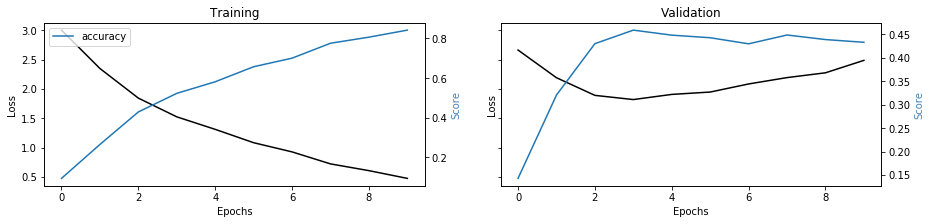

In [52]:
training = model.fit(x=X_train, y=y_train, batch_size=256, epochs=10, shuffle=True, verbose=0, validation_split=0.3)
utils_plot_keras_training(training)
## test
predicted_prob = model.predict(X_test)
predicted = [dic_y_mapping[np.argmax(pred)] for pred in predicted_prob]




Accuracy: 0.42
Auc: 0.85
Detail:
                                                     precision    recall  f1-score   support

                               Biological Phenomena       0.40      0.41      0.40       278
                       Cell Physiological Phenomena       0.37      0.43      0.40       282
                                 Chemical Phenomena       0.21      0.14      0.17       113
Circulatory and Respiratory Physiological Phenomena       0.39      0.23      0.29       247
  Digestive System and Oral Physiological Phenomena       0.48      0.55      0.51       277
                                  Genetic Phenomena       0.40      0.37      0.38       268
                            Immune System Phenomena       0.45      0.27      0.33       237
       Integumentary System Physiological Phenomena       0.69      0.58      0.63       276
                              Mathematical Concepts       0.52      0.48      0.50       279
                                    

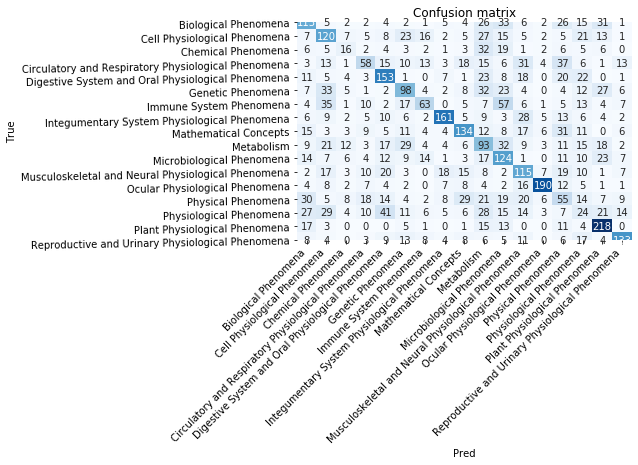

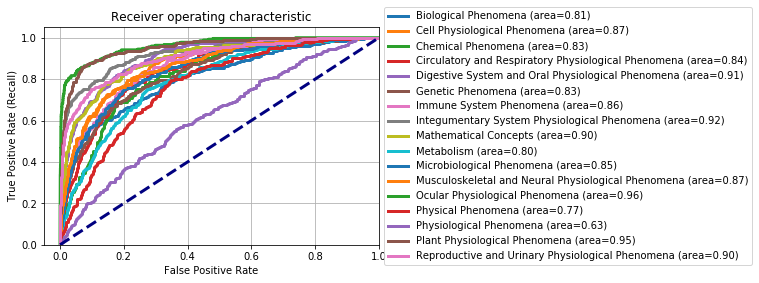

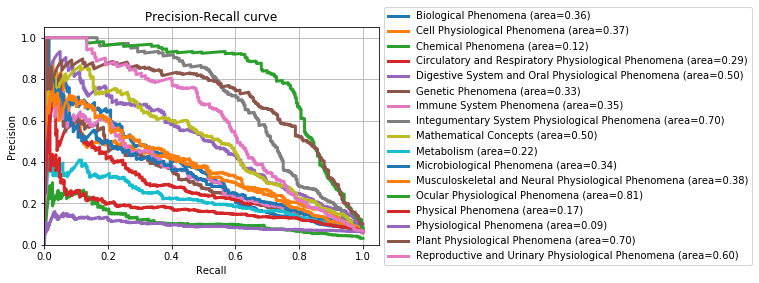

In [53]:
evaluate_multi_classif(y_test, predicted, predicted_prob, figsize=(15,5))

## Balancing Datasets

In [54]:
X_train

array([[ 6947,   496, 26326, ...,   219, 30490,  1706],
       [  958,  2053, 30491, ...,   156, 14855,  7784],
       [ 9407,  1059,  3766, ..., 26330,    56,  8258],
       ...,
       [  483,  1427,  1113, ...,     0,     0,     0],
       [   52,   258,  1785, ...,     0,     0,     0],
       [  204,  2417,  5854, ...,     0,     0,     0]], dtype=int32)

In [120]:
X_train.shape

(7757, 100)

In [124]:
X_train_new.shape

(19890, 100)

In [62]:
y_train = dtf_train["mesh_term"].values
y_test = dtf_test["mesh_term"].values

In [121]:
y_train

array([ 9,  2, 11, ...,  7,  4,  1])

In [32]:
from imblearn.over_sampling import SMOTE
sm = SMOTE(random_state = 33)

In [76]:
X_train_new, y_train_new = sm.fit_sample(X_train, y_train.ravel())

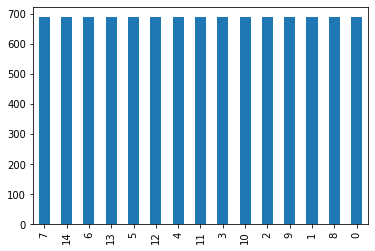

In [77]:
# observe that data has been balanced
pd.Series(y_train_new).value_counts().plot.bar()

In [35]:
y_train_new

array([ 9,  4, 15, ..., 16, 16, 16])

In [68]:
dic_y_mapping = {n:label for n,label in 
                 enumerate(np.unique(y_train_new))}
inverse_dic = {v:k for k,v in dic_y_mapping.items()}
y_train_new = np.array([inverse_dic[y] for y in y_train_new])

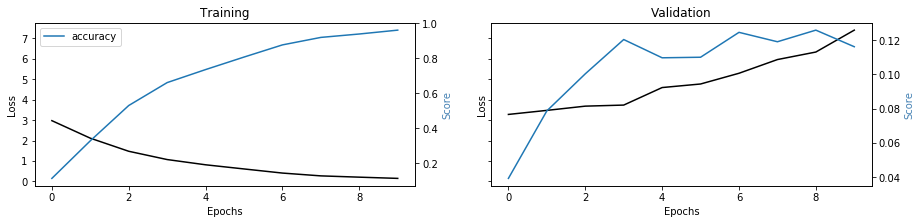

In [78]:
training = model.fit(x=X_train_new, y=y_train_new, batch_size=256, epochs=10, shuffle=True, verbose=0, validation_split=0.3)
utils_plot_keras_training(training)
## test
predicted_prob = model.predict(X_test)
predicted = [dic_y_mapping[np.argmax(pred)] for pred in predicted_prob]

Accuracy: 0.54
Auc: 0.9
Detail:
                                   precision    recall  f1-score   support

Bacterial Physiological Phenomena       0.23      0.18      0.20       239
                         Biofilms       0.60      0.67      0.63       293
            Catabolite Repression       0.68      0.48      0.57        66
       Drug Resistance, Microbial       0.64      0.63      0.64       279
                   Germ-Free Life       0.55      0.62      0.59       295
                    Hemadsorption       0.81      0.65      0.72       127
      Host Microbial Interactions       0.12      0.10      0.11        96
       Host-Pathogen Interactions       0.31      0.21      0.25       209
           Microbial Interactions       0.47      0.51      0.49       288
              Microbial Viability       0.47      0.60      0.53       296
                       Microbiota       0.51      0.52      0.52       266
                Nitrogen Fixation       0.80      0.70      0.75   

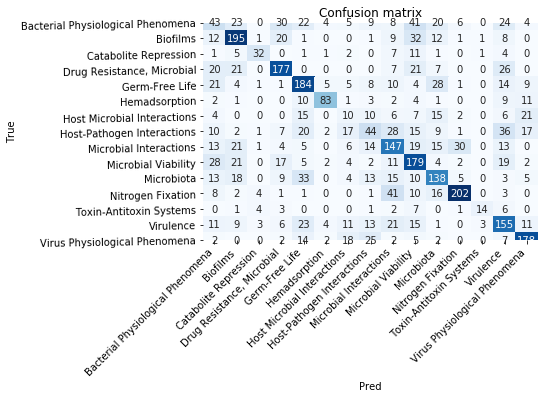

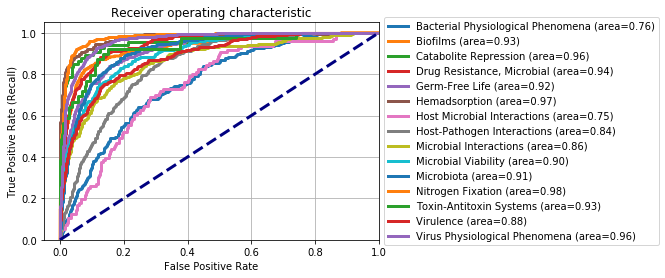

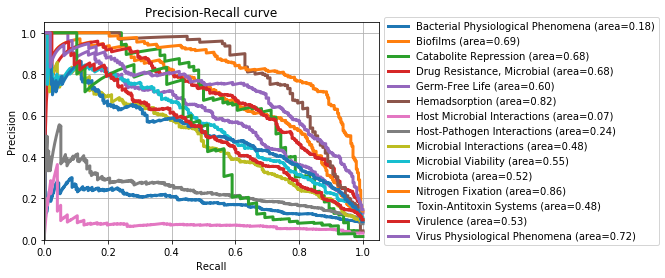

In [79]:
evaluate_multi_classif(y_test, predicted, predicted_prob, figsize=(15,5))

##  Create Weights with Trained Word Embeddings



In [64]:
corpus=dtf_train["clean_text"]

In [65]:
def utils_preprocess_ngrams(corpus, ngrams=1, grams_join=" ", lst_ngrams_detectors=[]):
    ## create list of n-grams
    lst_corpus = []
    for string in corpus:
        lst_words = string.split()
        lst_grams = [grams_join.join(lst_words[i:i + ngrams]) for i in range(0, len(lst_words), ngrams)]
        lst_corpus.append(lst_grams)
    
    ## detect common bi-grams and tri-grams
    if len(lst_ngrams_detectors) != 0:
        for detector in lst_ngrams_detectors:
            lst_corpus = list(detector[lst_corpus])
    return lst_corpus





In [66]:
## training OWN W2V
# nlp = gensim.models.word2vec.Word2Vec(lst_corpus, size=300,   
#              window=8, min_count=1, sg=1, iter=30)
def fit_w2v(corpus, ngrams=1, grams_join=" ", lst_ngrams_detectors=[], min_count=1, size=300, window=20, sg=1, epochs=30):
    lst_corpus = utils_preprocess_ngrams(corpus, ngrams=ngrams, grams_join=grams_join, lst_ngrams_detectors=lst_ngrams_detectors)
    nlp = gensim.models.word2vec.Word2Vec(lst_corpus, size=size, window=window, min_count=min_count, sg=sg, iter=epochs)
    return lst_corpus, nlp.wv

In [67]:
# #for clean_text
# avg_len = np.max([len(text.split()) for text in dtf_train["clean_text"]]) /2 

# lst_corpus, nlp = fit_w2v(corpus=dtf_train["clean_text"], lst_ngrams_detectors=lst_ngrams_detectors,
#                            min_count=1, size=300, window=avg_len, sg=0, epochs=30)
#for entities
avg_len = np.max([len(text.split()) for text in dtf_train["clean_text"]]) /2 

lst_corpus, nlp = fit_w2v(corpus=dtf_train["clean_text"], lst_ngrams_detectors=lst_ngrams_detectors,
                           min_count=1, size=300, window=avg_len, sg=0, epochs=30)

I0115 21:01:04.811090 4406244800 word2vec.py:1588] collecting all words and their counts
I0115 21:01:04.812119 4406244800 word2vec.py:1573] PROGRESS: at sentence #0, processed 0 words, keeping 0 word types
I0115 21:01:05.006267 4406244800 word2vec.py:1596] collected 58038 word types from a corpus of 906894 raw words and 7757 sentences
I0115 21:01:05.007127 4406244800 word2vec.py:1647] Loading a fresh vocabulary
I0115 21:01:05.631506 4406244800 word2vec.py:1671] effective_min_count=1 retains 58038 unique words (100% of original 58038, drops 0)
I0115 21:01:05.632395 4406244800 word2vec.py:1677] effective_min_count=1 leaves 906894 word corpus (100% of original 906894, drops 0)
I0115 21:01:05.814934 4406244800 word2vec.py:1736] deleting the raw counts dictionary of 58038 items
I0115 21:01:05.816440 4406244800 word2vec.py:1739] sample=0.001 downsamples 13 most-common words
I0115 21:01:05.817026 4406244800 word2vec.py:1742] downsampling leaves estimated 896635 word corpus (98.9% of prior 906

I0115 21:01:53.324845 4406244800 base_any2vec.py:349] worker thread finished; awaiting finish of 1 more threads
I0115 21:01:53.363286 4406244800 base_any2vec.py:349] worker thread finished; awaiting finish of 0 more threads
I0115 21:01:53.364320 4406244800 base_any2vec.py:1346] EPOCH - 6 : training on 906894 raw words (896709 effective words) took 7.1s, 126217 effective words/s
I0115 21:01:54.519273 4406244800 base_any2vec.py:1305] EPOCH 7 - PROGRESS: at 14.27% examples, 111659 words/s, in_qsize 6, out_qsize 0
I0115 21:01:55.612472 4406244800 base_any2vec.py:1305] EPOCH 7 - PROGRESS: at 29.53% examples, 118606 words/s, in_qsize 5, out_qsize 0
I0115 21:01:56.657508 4406244800 base_any2vec.py:1305] EPOCH 7 - PROGRESS: at 43.75% examples, 119675 words/s, in_qsize 5, out_qsize 0
I0115 21:01:57.737962 4406244800 base_any2vec.py:1305] EPOCH 7 - PROGRESS: at 60.07% examples, 123841 words/s, in_qsize 6, out_qsize 1
I0115 21:01:58.796164 4406244800 base_any2vec.py:1305] EPOCH 7 - PROGRESS: at 7

I0115 21:02:34.716937 4406244800 base_any2vec.py:1346] EPOCH - 12 : training on 906894 raw words (896387 effective words) took 7.3s, 123172 effective words/s
I0115 21:02:35.753313 4406244800 base_any2vec.py:1305] EPOCH 13 - PROGRESS: at 14.27% examples, 124423 words/s, in_qsize 5, out_qsize 0
I0115 21:02:36.793656 4406244800 base_any2vec.py:1305] EPOCH 13 - PROGRESS: at 30.64% examples, 133083 words/s, in_qsize 5, out_qsize 0
I0115 21:02:37.874984 4406244800 base_any2vec.py:1305] EPOCH 13 - PROGRESS: at 47.04% examples, 134110 words/s, in_qsize 5, out_qsize 0
I0115 21:02:38.958106 4406244800 base_any2vec.py:1305] EPOCH 13 - PROGRESS: at 63.36% examples, 134637 words/s, in_qsize 5, out_qsize 0
I0115 21:02:39.968464 4406244800 base_any2vec.py:1305] EPOCH 13 - PROGRESS: at 71.97% examples, 123649 words/s, in_qsize 5, out_qsize 0
I0115 21:02:41.049916 4406244800 base_any2vec.py:1305] EPOCH 13 - PROGRESS: at 80.86% examples, 114960 words/s, in_qsize 5, out_qsize 0
I0115 21:02:42.055845 4406

I0115 21:03:18.787025 4406244800 base_any2vec.py:1305] EPOCH 19 - PROGRESS: at 56.81% examples, 157835 words/s, in_qsize 5, out_qsize 0
I0115 21:03:19.845018 4406244800 base_any2vec.py:1305] EPOCH 19 - PROGRESS: at 76.41% examples, 160078 words/s, in_qsize 5, out_qsize 0
I0115 21:03:20.851576 4406244800 base_any2vec.py:1305] EPOCH 19 - PROGRESS: at 95.14% examples, 161226 words/s, in_qsize 5, out_qsize 0
I0115 21:03:20.934911 4406244800 base_any2vec.py:349] worker thread finished; awaiting finish of 2 more threads
I0115 21:03:21.013296 4406244800 base_any2vec.py:349] worker thread finished; awaiting finish of 1 more threads
I0115 21:03:21.042513 4406244800 base_any2vec.py:349] worker thread finished; awaiting finish of 0 more threads
I0115 21:03:21.043256 4406244800 base_any2vec.py:1346] EPOCH - 19 : training on 906894 raw words (896580 effective words) took 5.5s, 163181 effective words/s
I0115 21:03:22.132411 4406244800 base_any2vec.py:1305] EPOCH 20 - PROGRESS: at 17.58% examples, 14

I0115 21:03:57.796469 4406244800 base_any2vec.py:1305] EPOCH 26 - PROGRESS: at 56.81% examples, 156518 words/s, in_qsize 5, out_qsize 0
I0115 21:03:58.863455 4406244800 base_any2vec.py:1305] EPOCH 26 - PROGRESS: at 76.41% examples, 158750 words/s, in_qsize 5, out_qsize 0
I0115 21:03:59.956469 4406244800 base_any2vec.py:1305] EPOCH 26 - PROGRESS: at 97.42% examples, 161231 words/s, in_qsize 3, out_qsize 0
I0115 21:04:00.007277 4406244800 base_any2vec.py:349] worker thread finished; awaiting finish of 2 more threads
I0115 21:04:00.030549 4406244800 base_any2vec.py:349] worker thread finished; awaiting finish of 1 more threads
I0115 21:04:00.037509 4406244800 base_any2vec.py:349] worker thread finished; awaiting finish of 0 more threads
I0115 21:04:00.038527 4406244800 base_any2vec.py:1346] EPOCH - 26 : training on 906894 raw words (896650 effective words) took 5.5s, 162817 effective words/s
I0115 21:04:01.079873 4406244800 base_any2vec.py:1305] EPOCH 27 - PROGRESS: at 17.58% examples, 15

I1227 11:45:22.718303 4562421184 keyedvectors.py:1353] precomputing L2-norms of word weight vectors


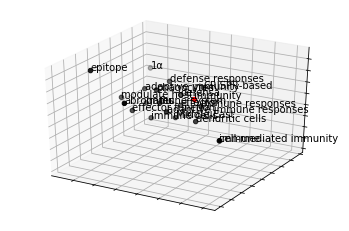

In [47]:

word =  'immunity'
fig = plt.figure()
## word embedding
tot_words = [word] + [tupla[0] for tupla in 
                 nlp.most_similar(word, topn=20)]
X = nlp[tot_words]
## pca to reduce dimensionality from 300 to 3
pca = manifold.TSNE(perplexity=40, n_components=3, init='pca')
X = pca.fit_transform(X)
## create dtf
dtf_ = pd.DataFrame(X, index=tot_words, columns=["x","y","z"])
dtf_["input"] = 0
dtf_["input"].iloc[0:1] = 1
## plot 3d
from mpl_toolkits.mplot3d import Axes3D
ax = fig.add_subplot(111, projection='3d')
ax.scatter(dtf_[dtf_["input"]==0]['x'], 
           dtf_[dtf_["input"]==0]['y'], 
           dtf_[dtf_["input"]==0]['z'], c="black")
ax.scatter(dtf_[dtf_["input"]==1]['x'], 
           dtf_[dtf_["input"]==1]['y'], 
           dtf_[dtf_["input"]==1]['z'], c="red")
ax.set(xlabel=None, ylabel=None, zlabel=None, xticklabels=[], 
       yticklabels=[], zticklabels=[])
for label, row in dtf_[["x","y","z"]].iterrows():
    x, y, z = row
    ax.text(x, y, z, s=label)

In [68]:
len(lst_corpus)

7757

In [69]:
## start the matrix (length of vocabulary x vector size) with all 0s
embeddings = np.zeros((len(dic_vocabulary)+1, 300))
for word,idx in dic_vocabulary.items():
    ## update the row with vector
    try:
        embeddings[idx] =  nlp[word]
    ## if word not in model then skip and the row stays all 0s
    except:
        pass

In [70]:
len(dic_vocabulary.items())

58038

In [174]:
dic_vocabulary.items()

dict_items([('study', 1), ('cells', 2), ('infection', 3), ('strains', 4), ('bacteria', 5), ('results', 6), ('genes', 7), ('bacterial', 8), ('isolates', 9), ('increased', 10), ('treatment', 11), ('host', 12), ('with', 13), ('species', 14), ('expression', 15), ('analysis', 16), ('strain', 17), ('associated', 18), ('activity', 19), ('protein', 20), ('patients', 21), ('studies', 22), ('gene', 23), ('human', 24), ('data', 25), ('resistance', 26), ('virus', 27), ('growth', 28), ('proteins', 29), ('production', 30), ('mice', 31), ('levels', 32), ('disease', 33), ('development', 34), ('effects', 35), ('biofilm', 36), ('model', 37), ('control', 38), ('reduced', 39), ('of', 40), ('potential', 41), ('group', 42), ('soil', 43), ('samples', 44), ('effect', 45), ('virulence', 46), ('microbial', 47), ('decreased', 48), ('response', 49), ('findings', 50), ('mechanisms', 51), ('cell', 52), ('detected', 53), ('plant', 54), ('biofilms', 55), ('infections', 56), ('increase', 57), ('system', 58), ('conditi

In [27]:
len(embeddings)

58140

In [53]:
y_train = dtf_train["dominant_topic"].values
y_test = dtf_test["dominant_topic"].values

In [54]:
dic_y_mapping = {n:label for n,label in 
                 enumerate(np.unique(y_train))}
inverse_dic = {v:k for k,v in dic_y_mapping.items()}
y_train = np.array([inverse_dic[y] for y in y_train])

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 100)]             0         
_________________________________________________________________
embedding_1 (Embedding)      (None, 100, 300)          25412400  
_________________________________________________________________
bidirectional_2 (Bidirection (None, 100, 200)          320800    
_________________________________________________________________
bidirectional_3 (Bidirection (None, 200)               240800    
_________________________________________________________________
dense_2 (Dense)              (None, 64)                12864     
_________________________________________________________________
dense_3 (Dense)              (None, 17)                1105      
Total params: 25,987,969
Trainable params: 575,569
Non-trainable params: 25,412,400
_________________________________________

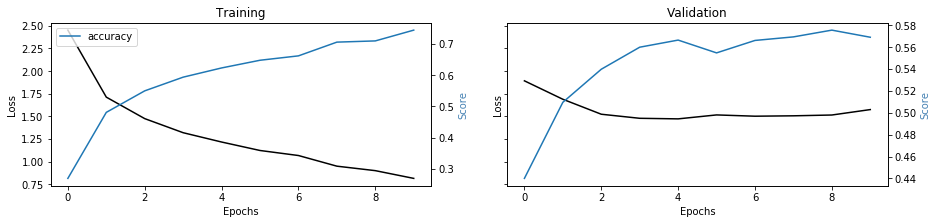

In [48]:
# Embedding network with Bi-LSTM 

## input
x_in = layers.Input(shape=(100,))
## embedding
x = layers.Embedding(input_dim=embeddings.shape[0],  
                     output_dim=embeddings.shape[1], 
                     weights=[embeddings],
                     input_length=300, trainable=False)(x_in)
## 2 layers of bidirectional lstm
x = layers.Bidirectional(layers.LSTM(units=100, dropout=0.2, 
                         return_sequences=True))(x)
x = layers.Bidirectional(layers.LSTM(units=100, dropout=0.2))(x)
## final dense layers
x = layers.Dense(64, activation='relu')(x)
y_out = layers.Dense(17, activation='softmax')(x)
## compile
model = models.Model(x_in, y_out)
model.compile(loss='sparse_categorical_crossentropy',
              optimizer='adam', metrics=['accuracy'])

model.summary()

## train
training = model.fit(x=X_train, y=y_train, batch_size=256, epochs=10, shuffle=True, verbose=0, validation_split=0.3)
utils_plot_keras_training(training)
## test
predicted_prob = model.predict(X_test)
predicted = [dic_y_mapping[np.argmax(pred)] for pred in predicted_prob]




Accuracy: 0.54
Auc: 0.91
Detail:
                                                     precision    recall  f1-score   support

                               Biological Phenomena       0.57      0.45      0.50       278
                       Cell Physiological Phenomena       0.40      0.57      0.47       282
                                 Chemical Phenomena       0.39      0.28      0.33       113
Circulatory and Respiratory Physiological Phenomena       0.54      0.58      0.56       247
  Digestive System and Oral Physiological Phenomena       0.61      0.72      0.66       277
                                  Genetic Phenomena       0.54      0.43      0.48       268
                            Immune System Phenomena       0.56      0.42      0.48       237
       Integumentary System Physiological Phenomena       0.78      0.77      0.78       276
                              Mathematical Concepts       0.57      0.62      0.59       279
                                    

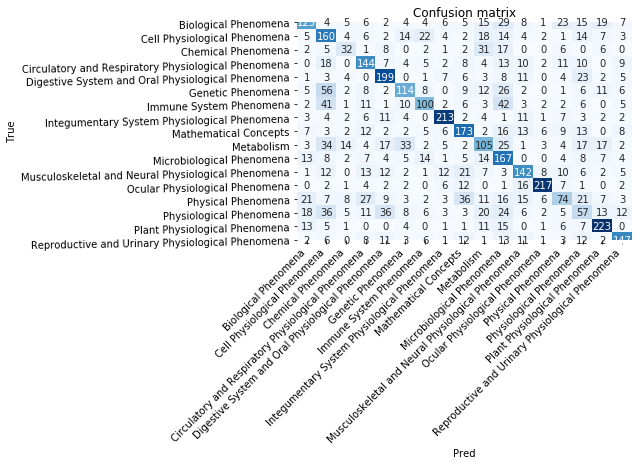

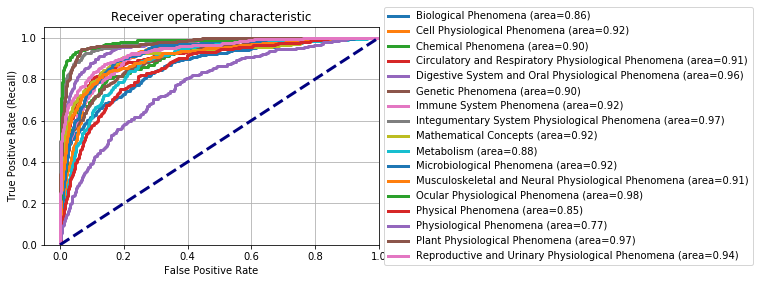

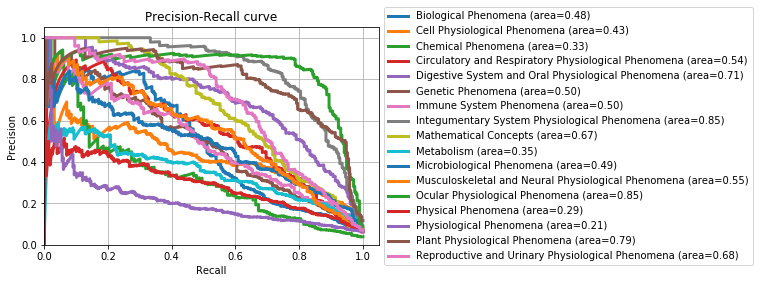

In [49]:
evaluate_multi_classif(y_test, predicted, predicted_prob, figsize=(15,5))

## GridSearch


In [234]:
from sklearn.model_selection import GridSearchCV
from keras.wrappers.scikit_learn import KerasClassifier
from sklearn.pipeline import Pipeline



In [286]:
# parameters

RANDOM_STATE = 0
NUM_CROSSVAL = 3
N_JOBS_CROSSVAL = -1  # number of CPUs used for crossvalidation. -1 => all
TEST_FRACTION = 0.3
LAYER = 2
FILTER_THRESHOLD = 0.0  # threshold for filtering by topic confidence

# keras params
NUM_EPOCHS_KERAS = 5  # number of epochs for Keras neural network
NLP_MODEL = 'en_core_sci_lg'  # model to populate Keras embedding layer with


In [287]:
#documents=dtf.abstract[~dtf.abstract.isna()]
documents=dtf.entities

In [288]:
len(documents)

11082

In [289]:
import keras_model as km
# Prepare the embedding layer
# This function creates the embedding layer with the (sci)spacy
# vectors, which is then shared across all folds of the 
# cross-validation.
# It also prepares the keras `Tokenizer` which is behind the scenes
# of the custom preprocessor `km.TokenizeAndPadTransformer`
km.prepare_embedding_layer(
    #documents=dtf.abstract[~dtf.abstract.isna()],
    documents=dtf.entities, 
    nlp_model=NLP_MODEL,
)

# Create the Keras preprocessor and predictor
output_dim = dtf.mesh_term_index.nunique()

keras_transformer = km.TokenizeAndPadTransformer()
keras_predictor = KerasClassifier(
    build_fn=km.create_model,
    output_dim=output_dim,
    epochs=NUM_EPOCHS_KERAS,
    batch_size=64,
    verbose=0
)
keras_predictor_lstm = KerasClassifier(
    build_fn=km.create_model_lstm,
    output_dim=output_dim,
    epochs=NUM_EPOCHS_KERAS,
    batch_size=64,
    verbose=0
)

In [290]:
#dtf.mesh_term.value_counts().index
dtf.mesh_term_index.nunique()

15

In [291]:
# from sklearn.model_selection import train_test_split, cross_val_score
# # split the test and training data

entities_train, entities_test, y_train, y_test = train_test_split(
    dtf.entities[~dtf.abstract.isna()],
    dtf.mesh_term_index[~dtf.abstract.isna()],
    test_size=TEST_FRACTION,
    stratify=dtf.mesh_term_index[~dtf.abstract.isna()],
    shuffle=True,
    random_state=RANDOM_STATE
)

In [292]:
# construct a pipeline with the transformer and predictor
# defined above
keras_pipeline = Pipeline(steps=[
    ('keras_transformer', keras_transformer),
    ('keras_conv', keras_predictor)
])
# construct the parameters to search over
# Because the pipeline consists of multiple steps, we can
# specify which step in the pipeline the parameters should
# go to by prefixing the parameter name with the pipeline
# step name and "__". All the parameters go to the
# 'keras_conv' step
keras_param_grid = {
    'keras_conv__optimizer': ['SGD', 'RMSprop', 'Adam'],
    'keras_conv__conv_kernel_size': [3, 5, 9],
    'keras_conv__conv_pool_steps': [2, 3, 5],
}
# create and fit the grid search
# Keras has problems with using multiple CPUs and sharing the 
# embedding layer, so n_jobs has to be equal to 1
clf_keras = GridSearchCV(
    estimator=keras_pipeline,
    param_grid=keras_param_grid,
    n_jobs=1,
    cv=3
    )
clf_keras.fit(entities_train, y_train)
# sorted(clf_keras.cv_results_.keys())

GridSearchCV(cv=3,
             estimator=Pipeline(steps=[('keras_transformer',
                                        TokenizeAndPadTransformer(max_sequence_length=467)),
                                       ('keras_conv',
                                        <keras.wrappers.scikit_learn.KerasClassifier object at 0x204398f90>)]),
             n_jobs=1,
             param_grid={'keras_conv__conv_kernel_size': [3, 5, 9],
                         'keras_conv__conv_pool_steps': [2, 3, 5],
                         'keras_conv__optimizer': ['SGD', 'RMSprop', 'Adam']})

In [293]:
print("Best parameters: ", clf_keras.best_params_)

Best parameters:  {'keras_conv__conv_kernel_size': 3, 'keras_conv__conv_pool_steps': 2, 'keras_conv__optimizer': 'Adam'}


In [282]:
len(abstracts_train)

7757